# $\xi(n_1, n_2, r)$:

In [8]:
import numpy as np
import importlib
from matplotlib import pyplot as plt
from gal_goku import summary_stats
from gal_goku import plot
from scipy.interpolate import bisplev
importlib.reload(summary_stats)
def do_spine_n1_n2(fid='HF', r=10, savefig=None, allow_scipy=False):
    """
    Check the accuracy of the spline interpolation on
    (n1, n2) pairs of the correlation function
    """
    ## Load the data
    data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
    xi = summary_stats.Xi(data_dir, fid, logging_level='ERROR')
    
    fig, ax = plt.subplots(len(xi.sim_tags), 4, figsize=(15, 3*len(xi.sim_tags)))
    for i, stag in enumerate(xi.sim_tags):
        ## Fit the spline
        r0, tx, mass_bins, corr_2d, spline = xi._sim_fit_spline_n1n2(stag, r=r, allow_scipy=allow_scipy)
        if spline is None:
            continue
        # Allow scipy to define the knots
        if allow_scipy:
            coeff_counts = spline[2].size
            corr_approx = bisplev(mass_bins, mass_bins, spline)
        else:
            coeff_counts = spline.get_coeffs().size
            corr_approx = spline(mass_bins, mass_bins)
        n1_n2_counts= np.triu(corr_2d).size
        # Flip the mass bins to match the original
        corr_approx = np.flip(corr_approx, axis=(0,1))
        corr_2d = np.flip(corr_2d, axis=(0,1))
        mass_bins = mass_bins[::-1]
        # Fractional error
        frac_err = 10**corr_2d/10**corr_approx -1
        abs_err = np.abs(frac_err[corr_2d > -9])

        corr_2d[corr_2d < -9] = np.nan
        frac_err[np.isnan(corr_2d)] = np.nan


        # Plotting
        ## Plot the original and interpolated correlation functions
        extent=[mass_bins[0], mass_bins[-1], mass_bins[0], mass_bins[-1]]
        vmin, vmax = np.nanmin(corr_2d[corr_2d > -8]), np.nanmax(corr_2d[corr_2d > -8])
        cmap = plt.cm.viridis
        cmap.set_bad(color='white')
        im = ax[i, 0].imshow(corr_2d, origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap=cmap)
        cbar = fig.colorbar(im, ax=ax[i,0], fraction=0.046, pad=0.04)
        ax[i, 0].set_title(f'Original corr, r0 =  {(r0):.2f}')
        ax[i, 0].set_xlabel('M1')
        ax[i, 0].set_ylabel('M2')
        im = ax[i, 1].imshow(corr_approx, origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap=cmap)
        cbar = fig.colorbar(im, ax=ax[i,1], fraction=0.046, pad=0.04)
        ax[i, 1].set_title(f'Interpolated corr, r0 = {(r0):.2f}')
        ax[i, 1].set_xlabel('M1')
        ax[i, 1].set_ylabel('M2')
        ## Plot the delta
        cmap = plt.cm.viridis
        cmap.set_bad(color='white')
        im = ax[i, 2].imshow(frac_err, origin='lower', extent=extent, vmin=-0.2, vmax=0.2, cmap=cmap)
        cbar = fig.colorbar(im, ax=ax[i,2], fraction=0.046, pad=0.04)
        
        ax[i, 2].set_title(f'Fractional error, new vs old grid: {tx.size} {mass_bins.size}')
        ax[i, 2].set_xlabel('M1')
        ax[i, 2].set_ylabel('M2')
       
        ax[i, 3].hist(abs_err.flatten(), bins=100, range=(0, 0.1), cumulative=True, density=True)
        ax[i,3].set_ylim(0.5, 1)
        ax[i, 3].set_title(f'Fractional error histogram')
        ax[i, 3].set_xlabel('Fractional error')
        ax[i, 3].set_ylabel('Counts')
        ax[i,3].grid()
        
    #fig.suptitle(f'LOO {n_components} PCA components vs original {orig_shape[1]*orig_shape[2]} bins | fid {fid}')
    fig.tight_layout()
    if savefig is not None:
        fig.savefig(savefig)
        plt.close(fig)


Wether if we allow scipy to pick the knots (under some smoothness assumption) or us, the fit doesn't chage much:

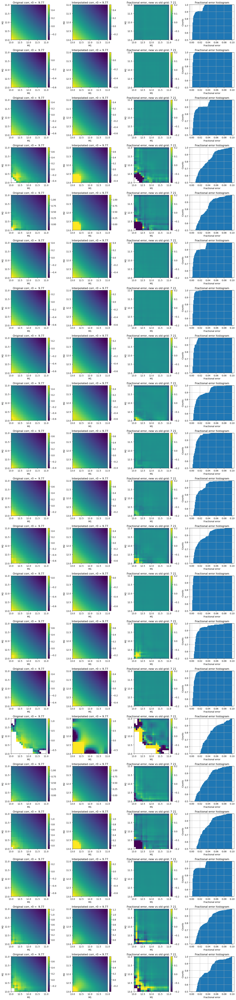

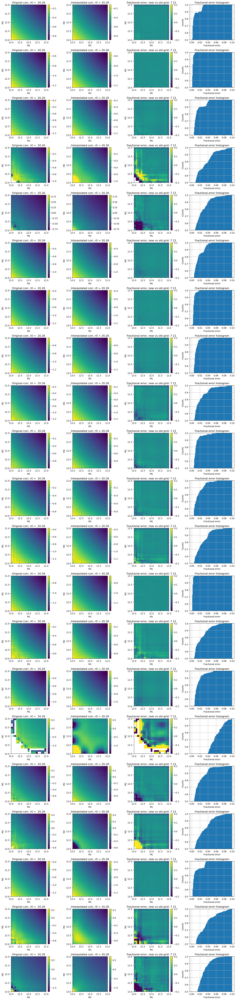

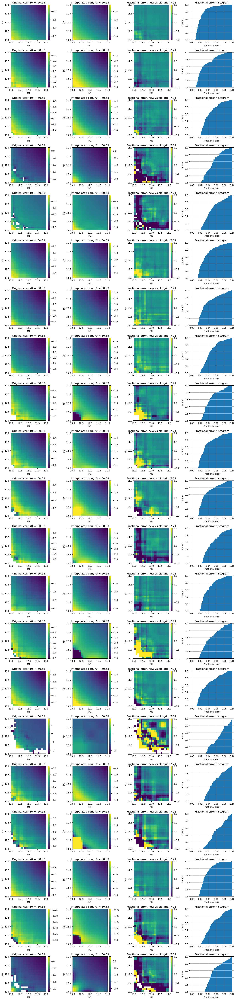

In [11]:
do_spine_n1_n2(fid='HF', r=10, allow_scipy=True)
do_spine_n1_n2(fid='HF', r=20, allow_scipy=True)
do_spine_n1_n2(fid='HF', r=60, allow_scipy=True)

Use our own predefined knots:

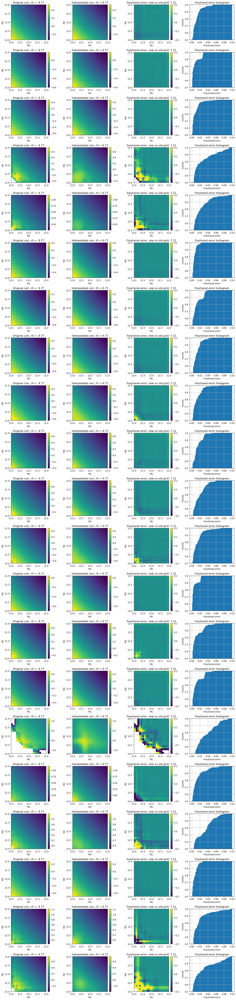

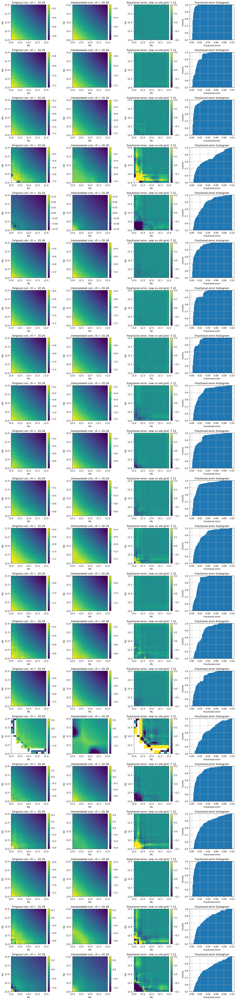

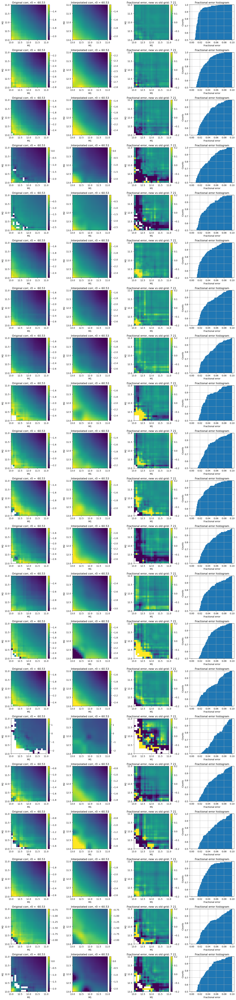

In [12]:
do_spine_n1_n2(fid='HF', r=10)
do_spine_n1_n2(fid='HF', r=20)
do_spine_n1_n2(fid='HF', r=60)

In [2]:
do_spine_n1_n2(fid='L2', r=10, savefig='/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/figs/spline_n1n2_L2_r10.png')

In [10]:
do_spine_n1_n2(fid='L2', r=20, savefig='/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/figs/spline_n1n2_L2_r20.png')

### Err vs (r, n1, n2) across all sims

In [1]:
import numpy as np
import importlib
from matplotlib import pyplot as plt
from gal_goku import summary_stats
importlib.reload(summary_stats)

def get_err_spline_n1_n2(fid='HF'):
    """
    Check the accuracy of the spline interpolation on
    (n1, n2) pairs of the correlation function
    """
    ## Load the data
    data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
    xi = summary_stats.Xi(data_dir, fid, logging_level='ERROR')
    # store all the fractional errors
    abs_errs = np.full((len(xi.sim_tags), xi.mass_bins.size, xi.mass_bins.size, xi.rbins.size), np.nan)
    for r_ind in range(xi.rbins.size):
        for i, stag in enumerate(xi.sim_tags):
            ## Fit the spline
            r0, tx, mass_bins, corr_2d, spline = xi._sim_fit_spline_n1n2(stag, r_ind=r_ind)
            # some sims don't have enough data to fit a spline
            if spline is None:
                abs_errs[i, :, :, r_ind] = np.nan
            else:
                corr_approx = spline(mass_bins, mass_bins)
                # Flip the mass bins to match the original
                corr_approx = np.flip(corr_approx, axis=(0,1))
                corr_2d = np.flip(corr_2d, axis=(0,1))
                corr_2d[corr_2d < -9] = np.nan
                corr_approx[np.isnan(corr_2d)] = np.nan
                # Fractional error
                frac_err = (10**corr_2d / 10**corr_approx) -1
                #frac_err = corr_2d/corr_approx -1
                # Where the data doesn't exist, set the fractional error to nan
                abs_errs[i, :, :, r_ind] = np.abs(frac_err)
    return abs_errs, xi.mass_bins, xi.rbins

def plot_err_spline_n1_n2(fid='HF'):
    """
    Plot the mean fractional error of the spline interpolation on
    (n1, n2) pairs of the correlation function. 
    We are not comparing where the data is missing
    """
    fig, ax = plt.subplots(1, 2, figsize=(8, 3), sharey=True)
    fig.subplots_adjust(wspace=0)
    
    abs_errs, mass_bins, rbins = get_err_spline_n1_n2(fid)
    ax[0].errorbar(rbins, np.nanmean(abs_errs, axis=(0,1,2)), yerr=np.nanstd(abs_errs, axis=(0,1,2)), fmt='o', label='Mean fractional error')
    ax[1].errorbar(rbins, np.nanmean(abs_errs, axis=(0,1,2)), yerr=np.nanstd(abs_errs, axis=(0,1,2)), fmt='o', label='Mean fractional error')

    ax[0].set_xlim(0.05, 50)
    ax[0].set_xscale('log')
    ax[0].set_ylim(0, 0.2)
    ax[0].grid()
    ax[0].set_xlabel('r [Mpc/h]')
    ax[0].set_ylabel(r'$| \xi_{spl}(n_1, n_2) / \xi(n_1,n_2) - 1 |$')
    ax[1].set_xlim(50, 80)
    ax[1].grid()

    fig,ax = plt.subplots(1, 1, figsize=(6, 6))
    err_n1_n2 = np.nanmean(abs_errs, axis=(0,3))
    if fid == 'HF':
        vmin, vmax = 0, 0.2
    else:
        vmin, vmax = 0, 0.4
    im = ax.imshow(err_n1_n2, origin='lower', extent=[mass_bins[-1], mass_bins[0], mass_bins[-1], mass_bins[0]], vmin=vmin, vmax=vmax)
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    ax.set_ylabel(r'$| \xi_{spl}(n_1, n_2) / \xi(n_1,n_2) - 1 |$')
    ax.set_xlabel('>M1')
    ax.set_ylabel('>M2')
    ax.set_title('across all r bins')
    cbar.set_label(r'$| \xi_{spl}(n_1, n_2) / \xi(n_1,n_2) - 1 |$')

    fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    abs_errs_flat = abs_errs.flatten()
    abs_errs_flat = abs_errs_flat[~np.isnan(abs_errs_flat)]
    ax.hist(abs_errs_flat, bins=100, range=(0, 0.1), cumulative=True, density=True)
    ax.set_ylim(0.5, 1)
    ax.set_title('Across all r bins')
    ax.set_xlabel(r'$| \xi_{spl}(n_1, n_2) / \xi(n_1,n_2) - 1 |$')
    ax.set_ylabel('Cumulative density')
    ax.grid()




2025-03-17 09:50:50.296094: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-17 09:50:50.299263: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-17 09:50:50.309286: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742223050.325861 2870295 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742223050.330790 2870295 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-17 09:50:50.348371: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:457: RuntimeWarning: invalid value encountered in log10
  corr_2d = np.log10(corr_2d)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=73). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  spline = LSQBivariateSpline(x_g.flatten(), y_g.flatten(), corr_grid, tx, ty, kx=3, ky=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=72). If deficiency is large, the results may be
inaccurate. Deficiency may strong

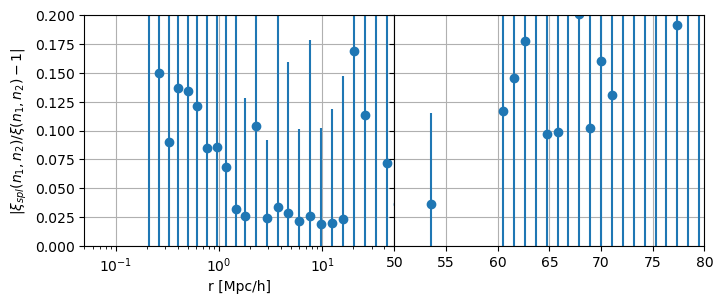

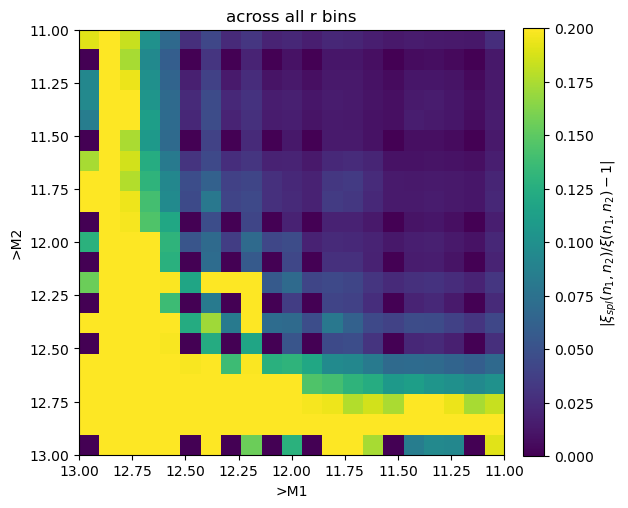

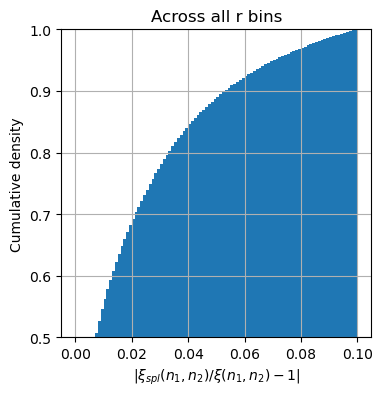

In [2]:
plot_err_spline_n1_n2(fid='HF')

For HF: 95 percentile error is ~ 5% fractional error.


For L2: 95 percentile error is ~ 8% fractional error.


/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=103). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  spline = LSQBivariateSpline(x_g.flatten(), y_g.flatten(), corr_grid, tx, ty, kx=3, ky=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=96). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  spline = LSQBivariateSpline(x_g.flatten(), y_g.flatten(), corr_grid, tx, ty, kx=3, ky=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/sr

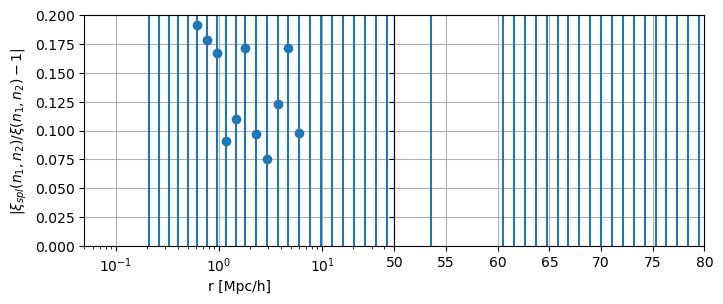

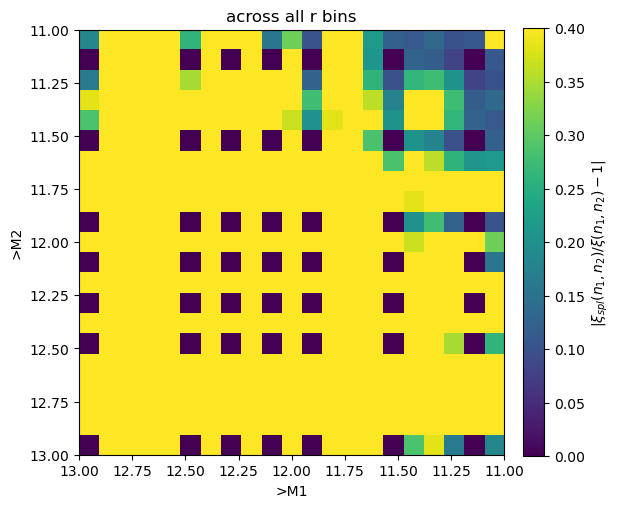

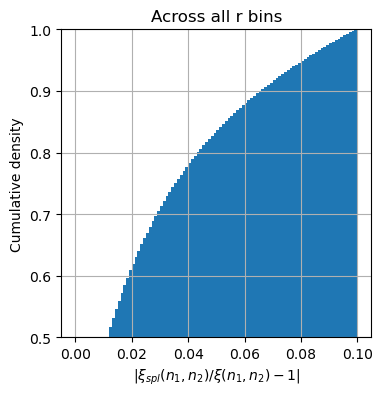

In [3]:
plot_err_spline_n1_n2(fid='L2')

## $\xi(r)$ at fixed $n_1, n_2$:

In [7]:
import importlib
import numpy as np
import matplotlib.pyplot as plt
from gal_goku import summary_stats
importlib.reload(summary_stats)
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
xi = summary_stats.Xi(data_dir, fid='HF', logging_level='ERROR')
xi.rbins
rbins = xi.rbins
# The fixed knots for the spline
tx = np.array([rbins[0], rbins[0], rbins[0], rbins[0], 1, 1.2, 1.5])
tx = np.append(tx, np.logspace(np.log10(2), np.log10(60), 5)[1:])
tx = np.append(tx, np.linspace(60, rbins[-1], 5)[1:])
tx = np.append(tx, [rbins[-1], rbins[-1], rbins[-1]])

x_g =  tx[4:-3]
print(x_g)
closest_indices = np.searchsorted(rbins, x_g)
closest_indices = np.clip(closest_indices, 1, len(rbins) - 1)
closest_indices = closest_indices - (np.abs(rbins[closest_indices - 1] - x_g) < np.abs(rbins[closest_indices] - x_g))
xg  = rbins[closest_indices]
print(xg)

[ 1.          1.2         1.5         4.68069464 10.95445115 25.63722038
 60.         64.86842105 69.73684211 74.60526316 79.47368421]
[ 0.9511597   1.17810543  1.45920017  4.71526961  9.77310384 25.82659532
 60.52631579 64.73684211 70.         74.21052632 79.47368421]


new points [ 0.21268578  0.32628708  0.50056595  0.9511597   1.17810543  1.45920017
  1.80736382  2.90060912  4.71526961  6.01194766  9.77310384 15.88729045
 25.82659532 41.98406441 60.52631579 64.73684211 70.         74.21052632
 79.47368421 79.47368421] 
 old points [ 0.21268578  0.26343238  0.32628708  0.40413884  0.50056595  0.62000047
  0.76793194  0.9511597   1.17810543  1.45920017  1.80736382  2.27499553
  2.90060912  3.69826365  4.71526961  6.01194766  7.66520638  9.77310384
 12.46066368 15.88729045 20.25622426 25.82659532 32.9287935  41.98406441
 53.52949432 60.52631579 61.57894737 62.63157895 63.68421053 64.73684211
 65.78947368 66.84210526 67.89473684 68.94736842 70.         71.05263158
 72.10526316 73.15789474 74.21052632 75.26315789 76.31578947 77.36842105
 78.42105263 79.47368421]


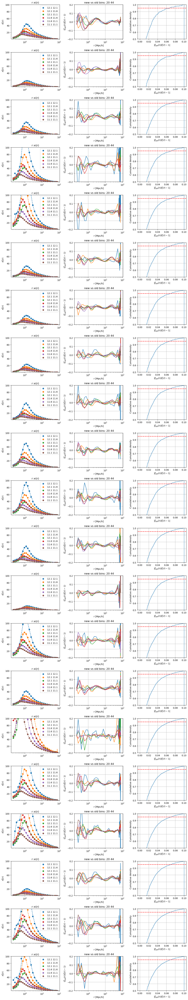

In [7]:
import importlib
import numpy as np
import matplotlib.pyplot as plt
from gal_goku import summary_stats
importlib.reload(summary_stats)

data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
xi = summary_stats.Xi(data_dir, fid='HF', logging_level='ERROR')
fig, ax = plt.subplots(len(xi.sim_tags), 3, figsize=(12, 3*len(xi.sim_tags)))
selected_mpairs = np.array([(12.1, 12.1), (12.1, 11.6), (12.1, 11.1), (11.6, 11.6), (11.6, 11.1), (11.1, 11.1)])
selected_mpairs = np.round(selected_mpairs, 2)
all_frac_err = []
for i, stag in enumerate(xi.sim_tags):
    # Fit the splie
    xg, corr, all_splines = xi._sim_fit_spline_r(xi.sim_tags[i])
    corr[corr <= -10] = np.nan
    # interate over selected mass pairs
    for p, mpair in enumerate(selected_mpairs):
        ind = np.where( (xi.mass_pairs[:,0] == mpair[0]) & (xi.mass_pairs[:,1] == mpair[1]))[0][0]
        data = 10**corr[ind].squeeze()
        # spline is not fit for mass pairs that don't have enough data
        if all_splines[ind] is None:
            continue
        fit = 10**all_splines[ind](np.log10(xi.rbins))
        fit[np.isnan(data)] = np.nan
        rbins_counts = xi.rbins.size
        new_rbins_counts = xg.size
        

        # Plot the r*xi(r)
        ax[i,0].scatter(xi.rbins, xi.rbins* data, label=f'{mpair[0]} {mpair[1]}', color=f'C{p}')
        ax[i,0].plot(xi.rbins, xi.rbins* fit, '--', color=f'C{p}')
        ax[i,0].set_ylim(1, 100)
        ax[i,0].set_xscale('log')
        ax[i,0].legend()
        ax[i,0].set_ylabel(r'$r \xi(r)$')
        ax[i,0].set_title('r xi(r)')

        # Plot the relative error
        frac_err = fit/ data- 1
        ax[i,1].plot(xi.rbins, frac_err, label=stag)
        ax[i,1].set_xscale('log')
        ax[i,1].set_ylim(-0.2, 0.2)
        ax[i,1].grid(True)
        
        ax[i,1].set_title(f' new vs old bins: {new_rbins_counts} {rbins_counts}')
        ax[i,1].set_ylabel(r'$(\xi_{spl}(r) / \xi(r) - 1)$')
        ax[i,1].set_xlabel('r [Mpc/h]')

        all_frac_err.append(frac_err)
        
    ax[i,2].hist(np.abs(all_frac_err).flatten(), bins=100, range=(0, 0.1), cumulative=True, density=True, histtype='step')
    ax[i,2].axhline(y=0.95, color='r', linestyle='--')
    ax[i,2].set_ylim(0.5, 1)
    ax[i,2].set_xlabel(r'$|\xi_{spl}(r) / \xi(r) - 1|$')
    ax[i,2].set_ylabel('Cumulative density')
    ax[i,2].grid()
print(f'new points {10**xg} \n old points {xi.rbins}')
fig.tight_layout()

/tmp/ipykernel_2874589/721812304.py:67: RuntimeWarning: Mean of empty slice
  all_frac_err = xi.make_3d_corr(np.nanmean(all_frac_err, axis=0), symmetric=True)
/tmp/ipykernel_2874589/721812304.py:68: RuntimeWarning: Mean of empty slice
  all_frac_err = np.nanmean(all_frac_err, axis=-1)


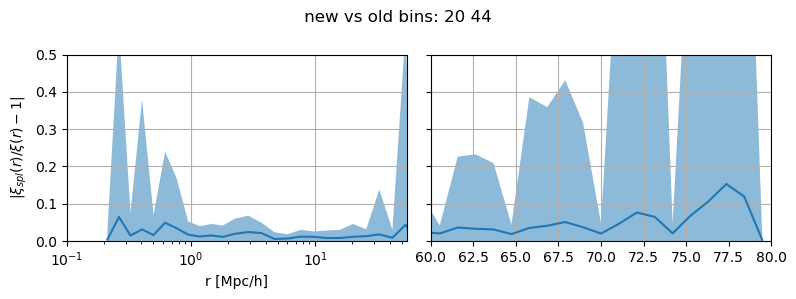

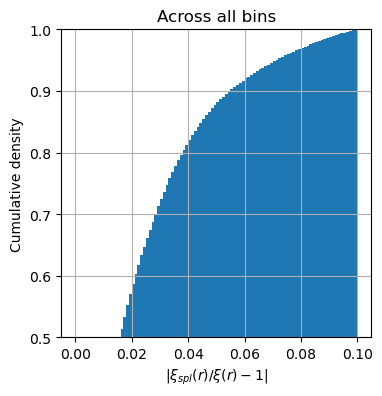

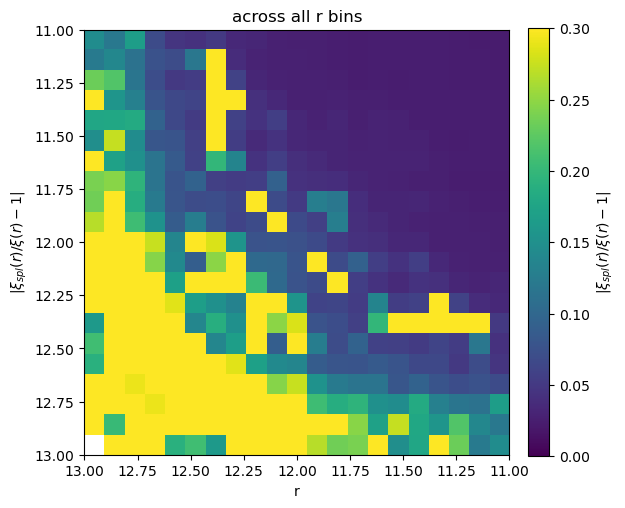

In [ ]:
import importlib
import numpy as np
import matplotlib.pyplot as plt
from gal_goku import summary_stats
importlib.reload(summary_stats)

def plot_err_spline_r(fid='HF'):
    """
    Plot the mean fractional error of the spline interpolation on
    r bins for all simulations. 
    """

    data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
    xi = summary_stats.Xi(data_dir, fid=fid, logging_level='ERROR')
    xg, corr, all_splines = xi._sim_fit_spline_r(xi.sim_tags[0])
    rbins_counts = xi.rbins.size
    new_rbins_counts = xg.size
    # This has a shape of (n_sims, n_mass_pairs, n_r_bins)
    all_frac_err = np.full((len(xi.sim_tags), xi.mass_pairs.shape[0], xi.rbins.size), np.nan)
    for i, stag in enumerate(xi.sim_tags):
        # Fit the splie
        xg, corr, all_splines = xi._sim_fit_spline_r(xi.sim_tags[i])
        for p, mpair in enumerate(xi.mass_pairs):
            if all_splines[p] is None:
                all_frac_err[i, p, :] = np.nan
            else:
                data = 10**corr[p].squeeze()
                fit = 10**all_splines[p](np.log10(xi.rbins))
                #assert np.all(np.isfinite(fit)), f'{fit}, {data}'
                fit[np.isnan(fit)] = np.nan
                data[~np.isfinite(data)] = np.nan
                rbins_counts = xi.rbins.size
                # The relative error
                frac_err = fit/ data- 1
                all_frac_err[i, p, :] = np.abs(frac_err)
    fig, ax = plt.subplots(1, 2, figsize=(8, 3), sharey=True)
    fig.subplots_adjust(wspace=0)
    percentiles = np.nanpercentile(all_frac_err, [50, 95], axis=(0,1))
    ax[0].fill_between(xi.rbins, percentiles[1], alpha=0.5)
    ax[0].plot(xi.rbins, percentiles[0], label='Median')
    ax[1].fill_between(xi.rbins, percentiles[1], alpha=0.5)
    ax[1].plot(xi.rbins, percentiles[0], label='Median')
    ax[0].set_xlim(0.1, 55)
    ax[0].set_xscale('log')
    ax[0].set_ylim(0, 0.1)
    ax[0].grid()
    ax[0].set_xlabel('r [Mpc/h]')
    ax[0].set_ylabel(r'$| \xi_{spl}(r) / \xi(r) - 1 |$')
    ax[1].set_xlim(60, 80)
    ax[1].set_ylim(0, 0.5)
    ax[1].grid()
    fig.suptitle(f' new vs old bins: {new_rbins_counts} {rbins_counts}')
    fig.tight_layout()

    # Cumulative error of all (n1, n2, r) bins
    fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    abs_errs_flat = all_frac_err.flatten()
    abs_errs_flat = abs_errs_flat[~np.isnan(abs_errs_flat)]
    ax.hist(abs_errs_flat, bins=100, range=(0, 0.1), cumulative=True, density=True)
    ax.set_ylim(0.5, 1)
    ax.set_title('Across all bins')
    ax.set_xlabel(r'$| \xi_{spl}(r) / \xi(r) - 1 |$')
    ax.set_ylabel('Cumulative density')
    ax.grid()

    # Error on (n, n2) plane
    all_frac_err = xi.make_3d_corr(np.nanmean(all_frac_err, axis=0), symmetric=True)
    all_frac_err = np.nanmean(all_frac_err, axis=-1)
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    if fid == 'HF':
        vmin, vmax = 0, 0.3
    else:
        vmin, vmax = 0, 0.4
    im = ax.imshow(all_frac_err, origin='lower', extent=[xi.mass_bins[-1], xi.mass_bins[0], xi.mass_bins[-1], xi.mass_bins[0]], vmin=vmin, vmax=vmax)
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    ax.set_ylabel(r'$| \xi_{spl}(r) / \xi(r) - 1 |$')
    ax.set_xlabel('r')
    ax.set_title('across all r bins')
    cbar.set_label(r'$| \xi_{spl}(r) / \xi(r) - 1 |$')



plot_err_spline_r(fid='HF')

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/scipy/interpolate/_fitpack_repro.py:700: RuntimeWarning: error. the maximal number of iterations maxit (set to 20
by the program) allowed for finding a smoothing spline
with fp=s has been reached. probably causes : s too small
there is an approximation returned but the corresponding
weighted sum of squared residuals does not satisfy the
condition abs(fp-s)/s < tol.

  _ = root_rati(f, p, bracket, acc)
/tmp/ipykernel_2874589/721812304.py:67: RuntimeWarning: Mean of empty slice
  all_frac_err = xi.make_3d_corr(np.nanmean(all_frac_err, axis=0), symmetric=True)
/tmp/ipykernel_2874589/721812304.py:68: RuntimeWarning: Mean of empty slice
  all_frac_err = np.nanmean(all_frac_err, axis=-1)


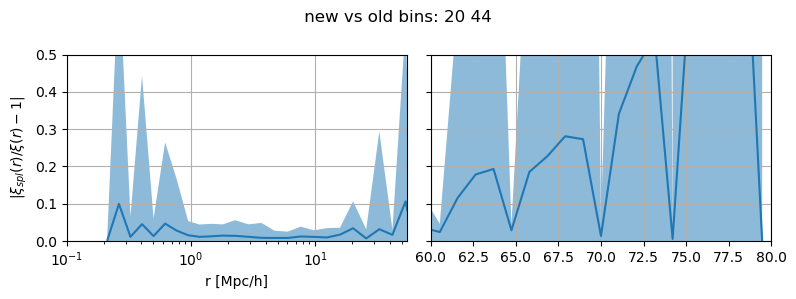

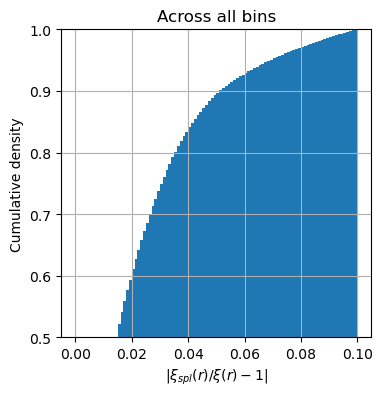

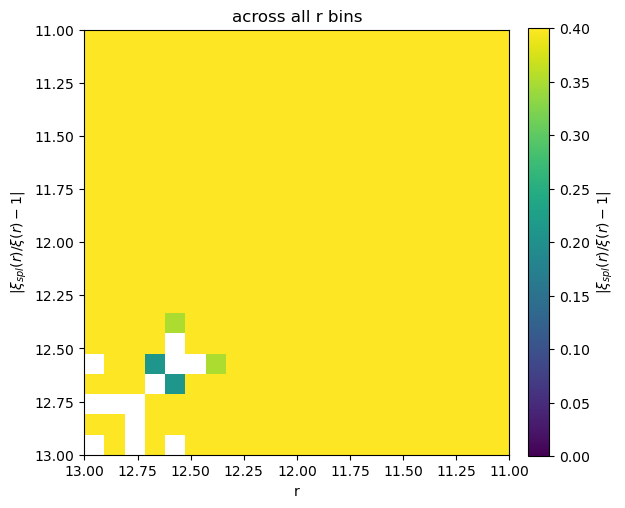

In [9]:
plot_err_spline_r(fid='L2')

We have inf predictions at high mass bins and some r. Maybe no spline for r dimension. 

## Weighted PCA on the resampled grid:

Let's use same wieghting scheme as DarkEmu: $n_1 n_2 r^2$. 
- [ ] We need to find a density (mass) cut above which we assign weights of 0.
- The spline wasn't good on r direction, so don't do that.

### Objectives:

1. Do we nedd spline dimensionality reduction before applying PCA?
2. How many componenets do we need?


/tmp/ipykernel_2878300/3355795551.py:17: RuntimeWarning: invalid value encountered in log10
  corr_3d_hf = np.log10(corr_3d_hf)
/tmp/ipykernel_2878300/3355795551.py:32: RuntimeWarning: invalid value encountered in log10
  corr_3d_lf = np.log10(corr_3d_lf)


cumulative explained var for HF with 5 out of all 21 sims: 
 [0.81546216 0.9047397  0.93111421 0.9468584  0.95750531]


/tmp/ipykernel_2878300/3355795551.py:17: RuntimeWarning: invalid value encountered in log10
  corr_3d_hf = np.log10(corr_3d_hf)


cumulative explained var for HF with 21 out of all 21 sims: 
 [0.81546216 0.9047397  0.93111421 0.9468584  0.95750531 0.96458256
 0.97103134 0.9767675  0.98107096 0.98444811 0.98768549 0.99083854
 0.99315506 0.9949424  0.99653112 0.99768694 0.99847392 0.99914093
 0.99960207 1.         1.        ]


/tmp/ipykernel_2878300/3355795551.py:32: RuntimeWarning: invalid value encountered in log10
  corr_3d_lf = np.log10(corr_3d_lf)
/tmp/ipykernel_2878300/3355795551.py:17: RuntimeWarning: invalid value encountered in log10
  corr_3d_hf = np.log10(corr_3d_hf)


cumulative explained var for HF with 21 out of all 21 sims: 
 [0.81546216 0.9047397  0.93111421 0.9468584  0.95750531 0.96458256
 0.97103134 0.9767675  0.98107096 0.98444811 0.98768549 0.99083854
 0.99315506 0.9949424  0.99653112 0.99768694 0.99847392 0.99914093
 0.99960207 1.         1.        ]


/tmp/ipykernel_2878300/3355795551.py:32: RuntimeWarning: invalid value encountered in log10
  corr_3d_lf = np.log10(corr_3d_lf)
/tmp/ipykernel_2878300/3355795551.py:17: RuntimeWarning: invalid value encountered in log10
  corr_3d_hf = np.log10(corr_3d_hf)


cumulative explained var for HF with 21 out of all 21 sims: 
 [0.81546216 0.9047397  0.93111421 0.9468584  0.95750531 0.96458256
 0.97103134 0.9767675  0.98107096 0.98444811 0.98768549 0.99083854
 0.99315506 0.9949424  0.99653112 0.99768694 0.99847392 0.99914093
 0.99960207 1.         1.        ]


/tmp/ipykernel_2878300/3355795551.py:32: RuntimeWarning: invalid value encountered in log10
  corr_3d_lf = np.log10(corr_3d_lf)


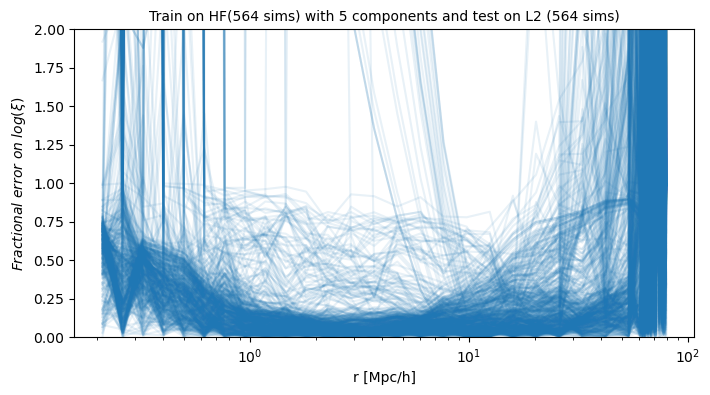

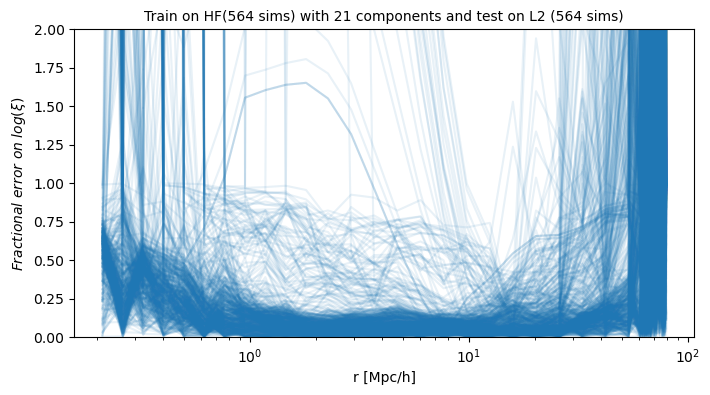

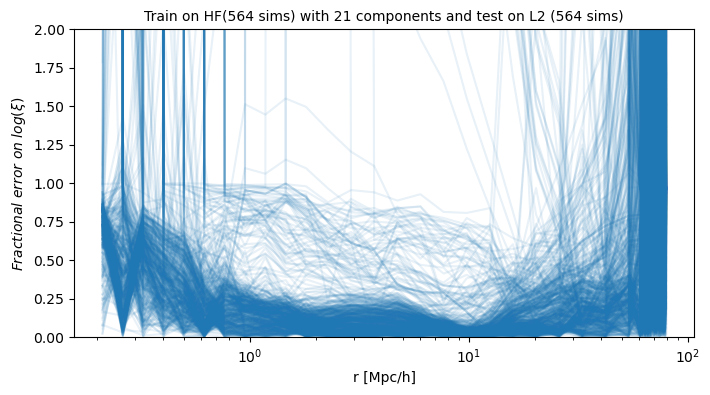

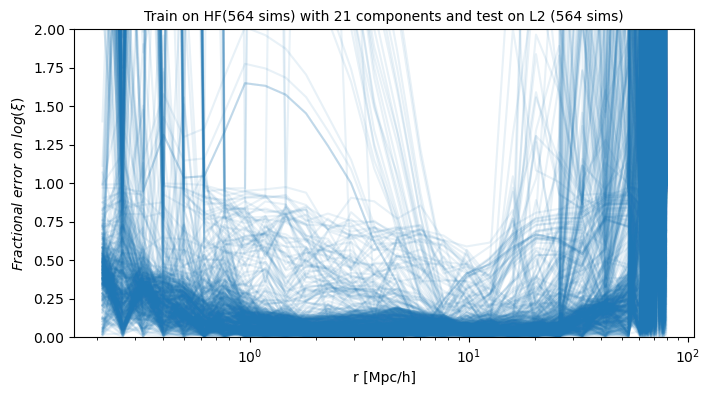

In [3]:
import importlib
import numpy as np
import importlib
from matplotlib import pyplot as plt
from gal_goku import summary_stats
importlib.reload(summary_stats)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
importlib.reload(summary_stats)
def check_pca(corr_3d_hf, corr_3d_lf, n_components=5, missing_val=-10):
    """
    Check the accuracy of the spline interpolation on
    (n1, n2) pairs of the correlation function
    """

    # Standardize the data
    corr_3d_hf = np.log10(corr_3d_hf)
    # Add weights
    for i in range(len(xi.rbins)):
        corr_3d_hf[:,:,i] *= xi.rbins[i]**2
    # Handle the missing data with wieghts of 0
    corr_3d_hf[np.isnan(corr_3d_hf)] = 0
    corr_3d_hf = corr_3d_hf.reshape(corr_3d_hf.shape[0], -1)    
    scaler = StandardScaler()
    corr_3d_hf_ransformed = scaler.fit_transform(corr_3d_hf)
    pca = PCA(n_components)
    pca.fit(corr_3d_hf_ransformed)

    print(f'cumulative explained var for HF with {n_components} out of all {corr_3d_hf.shape[0]} sims: \n {np.cumsum(pca.explained_variance_ratio_)}')

    # Test on L2:
    corr_3d_lf = np.log10(corr_3d_lf)
    corr_3d_lf = corr_3d_lf.reshape(corr_3d_lf.shape[0], -1)
    corr_3d_lf[np.isnan(corr_3d_lf)] = missing_val
    corr_lf_approx = pca.inverse_transform(pca.transform(scaler.fit_transform(corr_3d_lf)))
    corr_lf_approx = scaler.inverse_transform(corr_lf_approx)

    corr_3d_lf = corr_3d_lf.reshape(corr_3d_lf.shape[0], xi.mass_pairs.shape[0], xi.rbins.size)
    corr_lf_approx = corr_lf_approx.reshape(corr_lf_approx.shape[0], xi.mass_pairs.shape[0], xi.rbins.size)

    # Do not plot the bins with missing data


    # Plotting
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    for i in range(corr_lf_approx.shape[0]):
        frac_err = np.abs(10**corr_lf_approx[i,:]/10**corr_3d_lf[i,:] - 1)
        frac_err[np.isnan(corr_3d_lf[i,:])] = np.nan
        ax.plot(xi.rbins, frac_err[110,:], alpha=0.1, c='C0')
    ax.set_ylim(0,2)
    ax.set_xscale('log')
    ax.set_ylabel(r'$Fractional \ error \ on  \ log(\xi)$')
    ax.set_xlabel('r [Mpc/h]')
    ax.set_title(f'Train on HF({len(xi.sim_tags)} sims) with {n_components} components and test on L2 ({corr_3d_lf.shape[0]} sims)', fontsize=10)
    

## Load the data
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
xi = summary_stats.Xi(data_dir, fid='HF', logging_level='ERROR')
corr_3d_hf = xi.load_all_data()

xi = summary_stats.Xi(data_dir, fid='L2', logging_level='ERROR')
corr_3d_lf = xi.load_all_data()



check_pca(corr_3d_hf, corr_3d_lf, n_components=5, missing_val=0)
check_pca(corr_3d_hf, corr_3d_lf, n_components=21, missing_val=0)
check_pca(corr_3d_hf, corr_3d_lf, n_components=21, missing_val=-1)
check_pca(corr_3d_hf, corr_3d_lf, n_components=21, missing_val=0.5)


1. Dealing with the missing data is not trivial. We need to reaplce them with something. SPline helps with that:
2. It doesn't seem like even the entire HF simulation (21) suite is expressive enough for the rane of L2 sims.I doubt if partially fixing the missing bins with splie would change this much. It is just so bad.
- [ ] But check this by applying PCA on the spline fits.

/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:457: RuntimeWarning: invalid value encountered in log10
  corr_2d = np.log10(corr_2d)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=73). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  spline = LSQBivariateSpline(x_g.flatten(), y_g.flatten(), corr_grid, tx, ty, kx=3, ky=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=72). If deficiency is large, the results may be
inaccurate. Deficiency may strong

(21, 21)


/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=101). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  spline = LSQBivariateSpline(x_g.flatten(), y_g.flatten(), corr_grid, tx, ty, kx=3, ky=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:479: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=103). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  spline = LSQBivariateSpline(x_g.flatten(), y_g.flatten(), corr_grid, tx, ty, kx=3, ky=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/s

(21, 21)
(21, 441, 44) (564, 441, 44)
cumulative explained var for HF with 5 out of all 21 sims: 
 [0.87754769 0.9318346  0.95302393 0.96753338 0.9745518 ]
cumulative explained var for HF with 21 out of all 21 sims: 
 [0.87754769 0.9318346  0.95302393 0.96753338 0.9745518  0.98025583
 0.98459141 0.98736682 0.99001295 0.9922988  0.99445245 0.99627521
 0.99737956 0.99815541 0.9987297  0.99914372 0.99948698 0.99969089
 0.99986608 1.         1.        ]


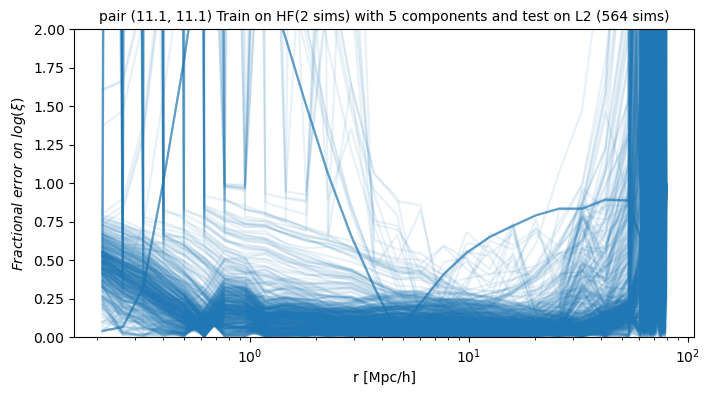

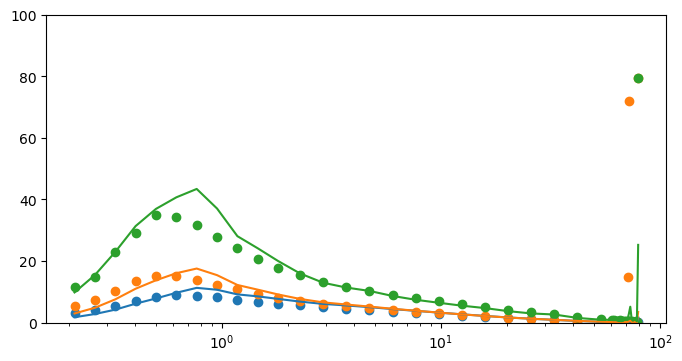

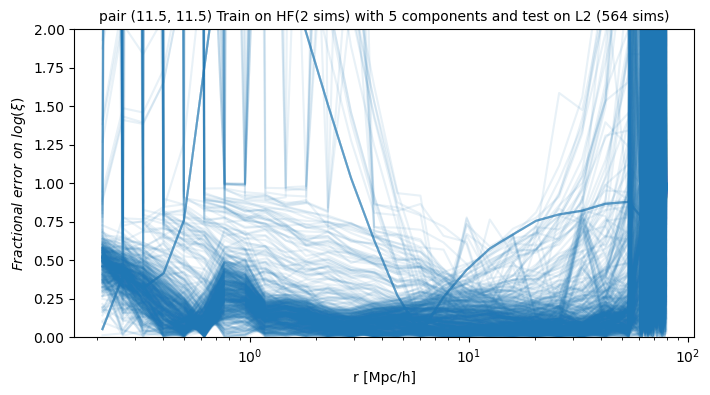

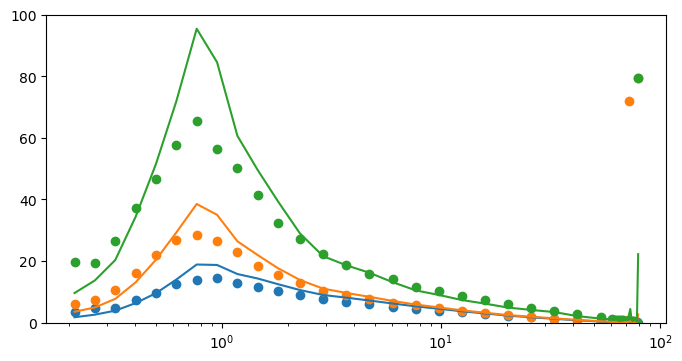

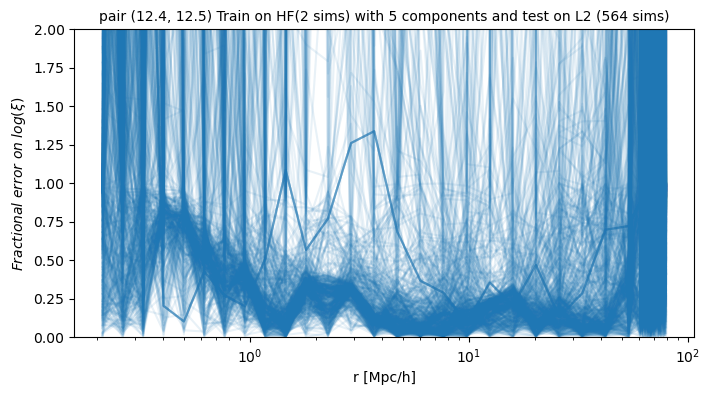

...

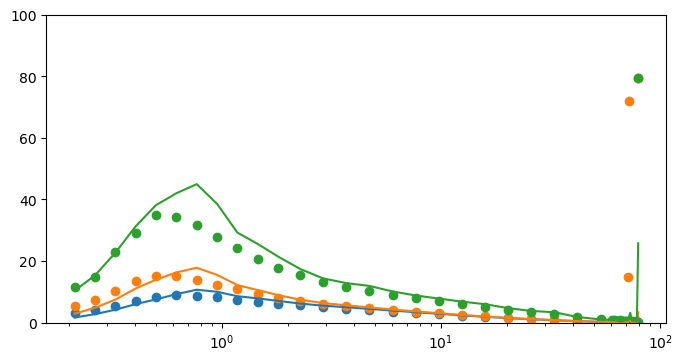

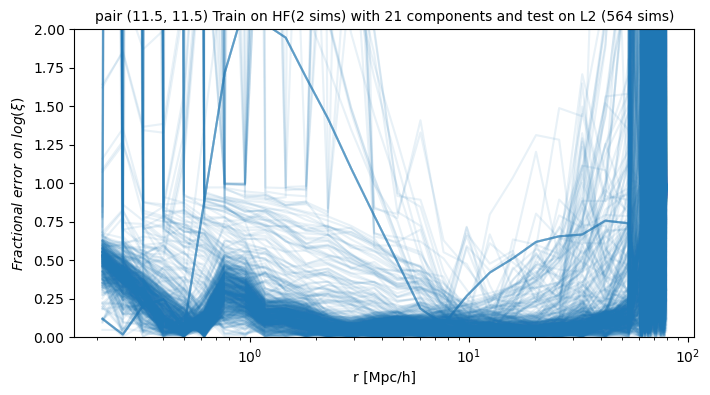

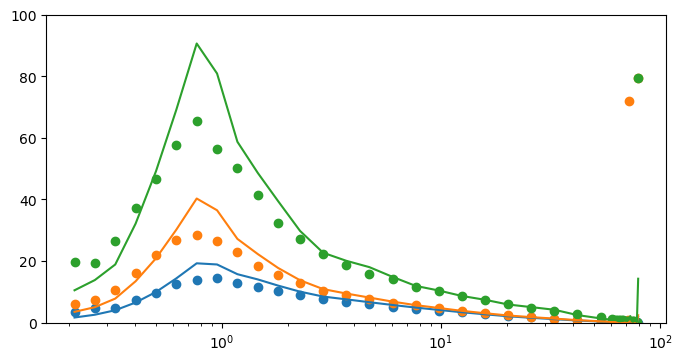

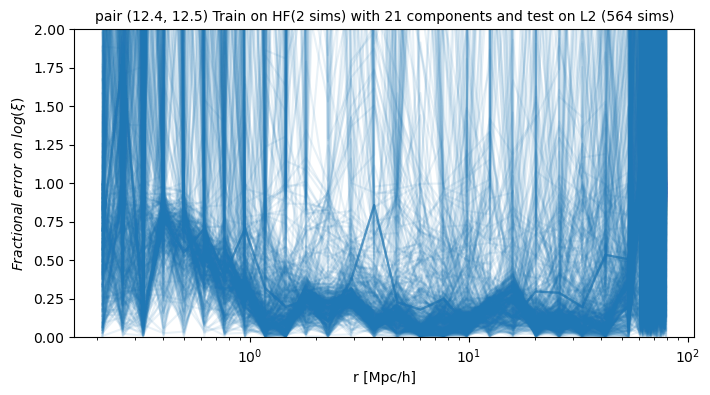

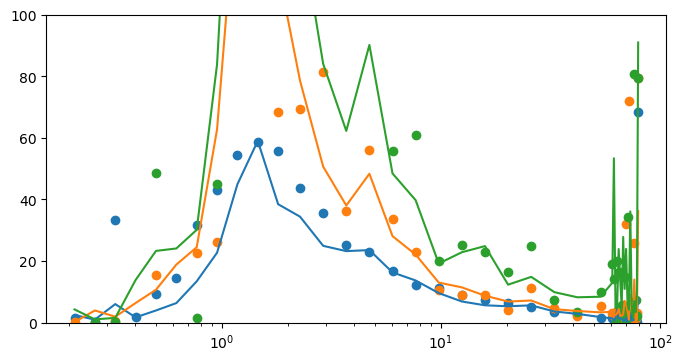

In [8]:
import importlib
import numpy as np
import importlib
from matplotlib import pyplot as plt
from gal_goku import summary_stats
importlib.reload(summary_stats)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
importlib.reload(summary_stats)
def check_pca(corr_3d_hf, corr_3d_lf, rbins,  n_components=5, missing_val=0, mass_pairs=None):
    """
    Check the accuracy of the spline interpolation on
    (n1, n2) pairs of the correlation function
    """

    # Standardize the data
    corr_3d_hf = np.log10(corr_3d_hf)
    num_mass_bins = mass_pairs[0].shape[0]
    num_rbins = corr_3d_hf.shape[2]
    # Add weights
    for i in range(len(rbins)):
        corr_3d_hf[:,:,i] *= rbins[i]**2
    # Handle the missing data with wieghts of 0
    corr_3d_hf[np.isnan(corr_3d_hf)] = 0
    corr_3d_hf = corr_3d_hf.reshape(corr_3d_hf.shape[0], -1)    
    scaler = StandardScaler()
    corr_3d_hf_ransformed = scaler.fit_transform(corr_3d_hf)
    pca = PCA(n_components)
    pca.fit(corr_3d_hf_ransformed)

    print(f'cumulative explained var for HF with {n_components} out of all {corr_3d_hf.shape[0]} sims: \n {np.cumsum(pca.explained_variance_ratio_)}')

    # Test on L2:
    corr_3d_lf = np.log10(corr_3d_lf)
    corr_3d_lf = corr_3d_lf.reshape(corr_3d_lf.shape[0], -1)
    corr_3d_lf[np.isnan(corr_3d_lf)] = missing_val
    corr_lf_approx = pca.inverse_transform(pca.transform(scaler.fit_transform(corr_3d_lf)))
    corr_lf_approx = scaler.inverse_transform(corr_lf_approx)
    # Do not plot the bins with missing data
    corr_3d_lf = corr_3d_lf.reshape(corr_3d_lf.shape[0], num_mass_bins, num_mass_bins, num_rbins)
    corr_lf_approx = corr_lf_approx.reshape(corr_lf_approx.shape[0], num_mass_bins, num_mass_bins, num_rbins)


    # Plotting
    for c, (m1, m2) in enumerate([(1,1), (5,5), (15, 14)]):
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        fig_corr, ax_corr = plt.subplots(1, 1, figsize=(8, 4))
        for i in range(corr_lf_approx.shape[0]):
            frac_err = np.abs(10**corr_lf_approx[i,:]/10**corr_3d_lf[i,:] - 1)
            frac_err[np.isnan(corr_3d_lf[i,:])] = np.nan
            ax.plot(rbins, frac_err[m1, m2,:], alpha=0.1, c='C0')
        ax.set_ylim(0,2)
        ax.set_xscale('log')
        ax.set_ylabel(r'$Fractional \ error \ on  \ log(\xi)$')
        ax.set_xlabel('r [Mpc/h]')
        ax.set_title(f'pair {mass_pairs[0][m1,m2], mass_pairs[1][m1,m2]} Train on HF({len(corr_3d_hf.shape)} sims) with {n_components} components and test on L2 ({corr_3d_lf.shape[0]} sims)', fontsize=10)
        for s, sim in enumerate([10, 20, 30]):
            ax_corr.plot(rbins, rbins * 10**corr_lf_approx[s, m1, m2, :], c=f'C{s}')
            ax_corr.scatter(rbins, rbins*  10**corr_3d_lf[s, m1, m2, :], c=f'C{s}')
        ax_corr.set_xscale('log')
        ax_corr.set_ylim(0, 100)
        

def get_spline_pred(fid='HF'):

    ## Load the data
    data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
    xi = summary_stats.Xi(data_dir, fid=fid, logging_level='ERROR')
    spline_fits = np.full((len(xi.sim_tags), xi.mass_bins.size, xi.mass_bins.size, xi.rbins.size), np.nan)
    for s, stag in enumerate(xi.sim_tags):
        for r_ind in range(xi.rbins.size):
            ## Fit the spline
            _, _, mass_bins, _, spline = xi._sim_fit_spline_n1n2(stag, r_ind=r_ind)
            if spline is None:
                if fid == 'HF':
                    raise ValueError(f'No spline fit for {stag} and r_ind {r_ind}, we must have them all for HF')
                else:
                    spline_fits[s, :,:, r_ind] = np.nan
            else:
                spline_fits[s, :,:, r_ind] = 10**spline(mass_bins, mass_bins)
    mass_pairs = np.meshgrid(mass_bins, mass_bins)
    print(mass_pairs[0].shape)

    return spline_fits, xi.rbins, mass_pairs



corr_3d_hf, rbins, mass_pairs = get_spline_pred(fid='HF')
corr_3d_hf = corr_3d_hf.reshape(corr_3d_hf.shape[0], -1, corr_3d_hf.shape[-1])
corr_3d_lf, _, _ = get_spline_pred(fid='L2')
corr_3d_lf = corr_3d_lf.reshape(corr_3d_lf.shape[0], -1, corr_3d_lf.shape[-1])

print(corr_3d_hf.shape, corr_3d_lf.shape)

np.random.seed(0)
check_pca(corr_3d_hf, corr_3d_lf, n_components=5, rbins=rbins, mass_pairs=mass_pairs)
check_pca(corr_3d_hf, corr_3d_lf, n_components=21, rbins=rbins, mass_pairs=mass_pairs)



PCA fits are too noisy in r idrection.

In [9]:
7*8 /2

28.0

In [10]:
21*22/2

231.0